## 2.1 Vision Transformer 실습

In [1]:
import os
from dotenv import load_dotenv
load_dotenv()  # .env 로드

token = os.environ.get("HF_TOKEN")
assert token, "HF_TOKEN이 비어있음"

### 1. VIT 개요

이미지 → 패치 분할 → Linear Embedding → Transformer Encoder → Classification Head

- 이미지를 고정 크기 패치(16x16 또는 14x14)로 분할
- 각 패치를 토큰처럼 취급
- NLP Transformer 아키텍처 그대로 적용

In [2]:
from transformers import pipeline
from PIL import Image
import requests

In [3]:
# 이미지 분류 파이프라인
classifier = pipeline(
    task="image-classification",
    model="google/vit-base-patch16-224"
)

Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


In [4]:
# 이미지 로드
from io import BytesIO

headers = {"User-Agent": "Mozilla/5.0"}

url = "https://upload.wikimedia.org/wikipedia/commons/4/4d/Cat_November_2010-1a.jpg"
resp = requests.get(url, headers=headers, timeout=10)
resp.raise_for_status()  # 200 OK 확인

# 일부 환경에서 stream=True + raw가 깨질 수 있어 BytesIO 사용
image = Image.open(BytesIO(resp.content)).convert("RGB")

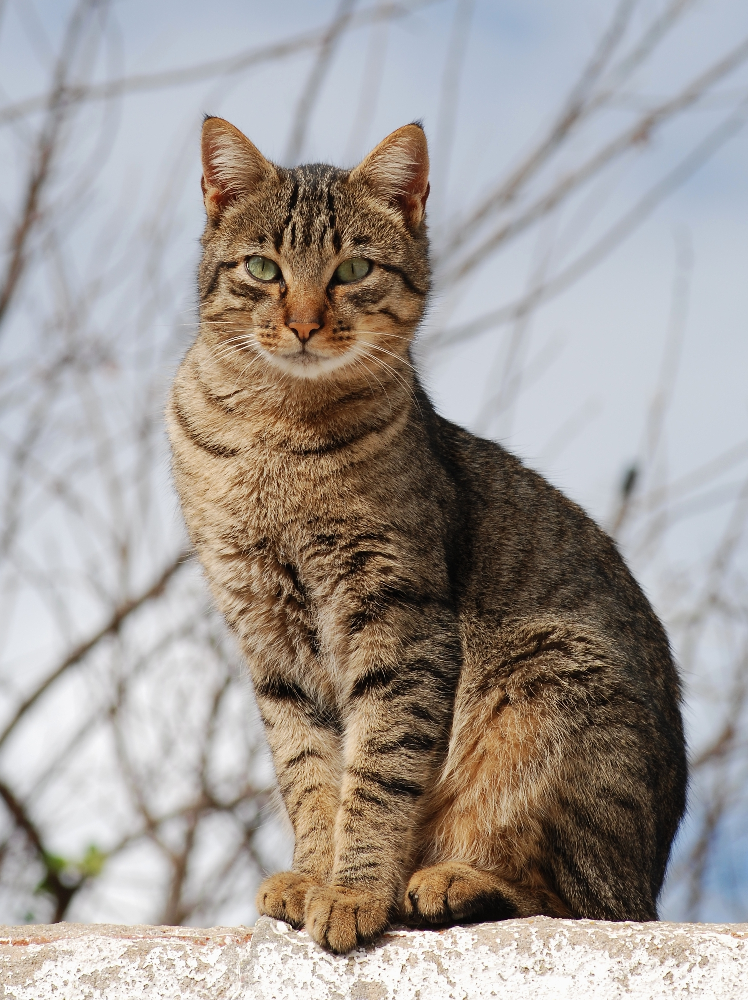

In [5]:
image

In [6]:
# 추론
results = classifier(image)

for result in results[:5]:
    print(f"{result['label']:40} | Score: {result['score']:.4f}")

Egyptian cat                             | Score: 0.4111
tabby, tabby cat                         | Score: 0.3131
tiger cat                                | Score: 0.2681
lynx, catamount                          | Score: 0.0037
Persian cat                              | Score: 0.0002


#### 로컬 대신 HF 추론 엔드포인트 사용방식
- Inference Endpoints: 전용(유료) 엔드포인트, 스케일/모니터링 포함
- HF Inference: 서버리스 API, 간단한 호출에 적합

In [7]:
import os
from io import BytesIO
from huggingface_hub import InferenceClient

client = InferenceClient(
    provider="hf-inference",
    api_key=os.environ["HF_TOKEN"],
)


result = client.image_classification("../../img_samples/cat.png", model="google/vit-base-patch16-224")


In [8]:
for result in results[:5]:
    print(f"{result['label']:40} | Score: {result['score']:.4f}")

Egyptian cat                             | Score: 0.4111
tabby, tabby cat                         | Score: 0.3131
tiger cat                                | Score: 0.2681
lynx, catamount                          | Score: 0.0037
Persian cat                              | Score: 0.0002


REST 직접 호출

In [9]:
import os
import requests

API_URL = "https://router.huggingface.co/hf-inference/models/google/vit-base-patch16-224"
headers = {
    "Authorization": f"Bearer {os.environ['HF_TOKEN']}",
}

def query(filename):
    with open(filename, "rb") as f:
        data = f.read()
    response = requests.post(
        API_URL,
        headers={"Content-Type": "image/jpeg", **headers},
        data=data,
        timeout=30,
    )
    response.raise_for_status()
    return response.json()

result = query("../../img_samples/cat.png")

In [10]:
for result in results[:5]:
    print(f"{result['label']:40} | Score: {result['score']:.4f}")

Egyptian cat                             | Score: 0.4111
tabby, tabby cat                         | Score: 0.3131
tiger cat                                | Score: 0.2681
lynx, catamount                          | Score: 0.0037
Persian cat                              | Score: 0.0002


### AutoImageProcessor + AutoModel 활용

In [11]:
from transformers import AutoImageProcessor, AutoModelForImageClassification
from PIL import Image
import requests
import torch
from io import BytesIO

model_name = "google/vit-base-patch16-224"

# 이미지 프로세서 & 모델 로드
image_processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForImageClassification.from_pretrained(model_name)

# 이미지 로드
headers = {"User-Agent": "Mozilla/5.0"}
url = "https://upload.wikimedia.org/wikipedia/commons/4/4d/Cat_November_2010-1a.jpg"
resp = requests.get(url, headers=headers, timeout=10)
resp.raise_for_status()
image = Image.open(BytesIO(resp.content)).convert("RGB")

# 전처리
inputs = image_processor(images=image, return_tensors="pt")
print(f"Input shape: {inputs['pixel_values'].shape}")
# torch.Size([1, 3, 224, 224])

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

Input shape: torch.Size([1, 3, 224, 224])


In [12]:
inputs

{'pixel_values': tensor([[[[0.2235, 0.2549, 0.3098,  ..., 0.4196, 0.4118, 0.4118],
          [0.2235, 0.2784, 0.3333,  ..., 0.4196, 0.4118, 0.4118],
          [0.2392, 0.3020, 0.3569,  ..., 0.4196, 0.4196, 0.4118],
          ...,
          [0.5686, 0.7647, 0.8510,  ..., 0.8667, 0.8824, 0.9059],
          [0.5451, 0.7490, 0.7255,  ..., 0.9059, 0.9059, 0.9373],
          [0.5137, 0.6000, 0.6000,  ..., 0.9137, 0.9373, 0.9373]],

         [[0.2706, 0.3333, 0.3961,  ..., 0.5137, 0.5059, 0.5059],
          [0.2863, 0.3490, 0.4196,  ..., 0.5059, 0.5059, 0.5059],
          [0.3098, 0.3725, 0.4431,  ..., 0.5059, 0.5059, 0.4980],
          ...,
          [0.4510, 0.7176, 0.8196,  ..., 0.8196, 0.8353, 0.8745],
          [0.4510, 0.6941, 0.6706,  ..., 0.8667, 0.8745, 0.9137],
          [0.4039, 0.5059, 0.4980,  ..., 0.8824, 0.9216, 0.9294]],

         [[0.3725, 0.4431, 0.5294,  ..., 0.6392, 0.6314, 0.6314],
          [0.3804, 0.4745, 0.5608,  ..., 0.6314, 0.6314, 0.6314],
          [0.4196, 0.5059

In [13]:
# 추론
with torch.no_grad():
    outputs = model(**inputs)
    logits = outputs.logits

In [14]:
logits

tensor([[-3.2819e-01,  1.7318e-01, -6.1986e-01,  1.9631e-01,  3.0366e-01,
         -4.8405e-01, -5.1107e-01,  7.7468e-01,  1.2450e+00,  8.9093e-01,
          1.0031e+00, -2.3736e-01,  4.3687e-01, -7.5602e-01, -7.2495e-01,
          6.3095e-01,  1.2293e-01,  2.2843e-01,  1.9113e+00, -6.4829e-01,
         -7.9533e-03,  5.5993e-01, -3.2120e-01, -2.8948e-01,  2.1025e-01,
          1.6968e-01,  1.1954e+00,  8.2275e-02, -5.2319e-01,  6.7742e-01,
         -9.1745e-02, -6.8881e-01,  1.3938e-01, -1.5590e+00, -5.6203e-01,
         -1.8439e-01,  7.6470e-01,  3.7604e-01,  1.3884e+00,  1.0495e+00,
         -3.2430e-01,  1.2956e+00,  9.0791e-01,  1.9783e-01,  3.7247e-01,
          1.6906e-01, -4.3068e-01,  1.5991e-01,  5.0730e-01, -1.1583e-01,
         -7.0685e-01, -1.1217e+00, -1.4273e-01, -5.2174e-01, -3.9865e-01,
         -8.9465e-01,  2.4570e-01, -2.0812e-01, -3.5795e-01,  3.5285e-02,
          9.3372e-01,  2.1508e-01,  5.2962e-01, -3.2847e-01, -3.3466e-01,
         -4.4053e-01,  4.6299e-01,  2.

In [15]:
# Top-5 예측
probs = torch.softmax(logits, dim=-1)
top5_probs, top5_indices = torch.topk(probs, 5)

print("\n=== Top 5 Predictions ===")
for prob, idx in zip(top5_probs[0], top5_indices[0]):
    label = model.config.id2label[idx.item()]
    print(f"{label:40} | {prob.item():.4f}")


=== Top 5 Predictions ===
Egyptian cat                             | 0.4111
tabby, tabby cat                         | 0.3131
tiger cat                                | 0.2681
lynx, catamount                          | 0.0037
Persian cat                              | 0.0002


다양한 VIT 모델 비교

In [16]:
from transformers import AutoImageProcessor, AutoModelForImageClassification
from PIL import Image
import requests
import torch
import time
from io import BytesIO

# 비교할 모델 목록
models = {
    "ViT-Base": "google/vit-base-patch16-224",
    "ViT-Large": "google/vit-large-patch16-224",
    "DeiT-Base": "facebook/deit-base-patch16-224",
    "DeiT-Small": "facebook/deit-small-patch16-224",
    "Swin-Tiny": "microsoft/swin-tiny-patch4-window7-224",
    "Swin-Base": "microsoft/swin-base-patch4-window7-224",
}

# 테스트 이미지
headers = {"User-Agent": "Mozilla/5.0"}
url = "https://upload.wikimedia.org/wikipedia/commons/4/4d/Cat_November_2010-1a.jpg"
resp = requests.get(url, headers=headers, timeout=10)
resp.raise_for_status()
image = Image.open(BytesIO(resp.content)).convert("RGB")

def compare_models(models: dict, image: Image.Image):
    results = {}
    
    for name, model_id in models.items():
        print(f"\n=== {name} ===")
        
        # 로드
        processor = AutoImageProcessor.from_pretrained(model_id)
        model = AutoModelForImageClassification.from_pretrained(model_id)
        model.eval()
        
        # 전처리
        inputs = processor(images=image, return_tensors="pt")
        
        # 추론 시간 측정
        start = time.time()
        with torch.no_grad():
            outputs = model(**inputs)
        inference_time = time.time() - start
        
        # 예측
        probs = torch.softmax(outputs.logits, dim=-1)
        top_prob, top_idx = torch.max(probs, dim=-1)
        label = model.config.id2label[top_idx.item()]
        
        results[name] = {
            "label": label,
            "confidence": top_prob.item(),
            "inference_time": inference_time,
            "params": sum(p.numel() for p in model.parameters()) / 1e6
        }
        
        print(f"  Prediction: {label}")
        print(f"  Confidence: {top_prob.item():.4f}")
        print(f"  Inference: {inference_time:.4f}s")
        print(f"  Parameters: {results[name]['params']:.1f}M")
    
    return results

# 실행 (일부 모델만 테스트)
results = compare_models(
    {k: v for k, v in list(models.items())[:3]},  # 처음 3개만
    image
)


=== ViT-Base ===


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

  Prediction: Egyptian cat
  Confidence: 0.4111
  Inference: 0.0997s
  Parameters: 86.6M

=== ViT-Large ===


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Loading weights:   0%|          | 0/392 [00:00<?, ?it/s]

  Prediction: Egyptian cat
  Confidence: 0.5006
  Inference: 0.2602s
  Parameters: 304.3M

=== DeiT-Base ===


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

  Prediction: tabby, tabby cat
  Confidence: 0.1403
  Inference: 0.1105s
  Parameters: 86.6M


--- 나머지 생략

### 5. Object Detection

#### 5.1 DETR (DEtection TRansformer)

In [17]:
from transformers import pipeline
from PIL import Image
import requests

# Object Detection 파이프라인
detector = pipeline(
    task="object-detection",
    model="facebook/detr-resnet-50"
)

# 이미지 로드
headers = {"User-Agent": "Mozilla/5.0"}
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/4/4d/Cat_November_2010-1a.jpg/1200px-Cat_November_2010-1a.jpg"
resp = requests.get(url, headers=headers, timeout=10)
resp.raise_for_status()
image = Image.open(BytesIO(resp.content)).convert("RGB")

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/Users/kmyu/Desktop/project/cv-study/.venv/lib/python3.12/site-packages/torch/nn/modules/module.py:2446: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/Users/kmyu/Desktop/project/cv-study/.venv/lib/python3.12/site-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/Users/kmyu/Desktop/project/cv-study/.venv/lib/python3.12/site-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.bias: copying from a non-meta parameter in

Loading weights:   0%|          | 0/530 [00:00<?, ?it/s]

DetrForObjectDetection LOAD REPORT from: facebook/detr-resnet-50
Key                                                                         | Status     |  | 
----------------------------------------------------------------------------+------------+--+-
model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

The image processor of type `DetrImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


In [18]:
# 탐지
results = detector(image)

print("=== Detected Objects ===")
for obj in results:
    print(f"  {obj['label']:15} | Score: {obj['score']:.4f} | Box: {obj['box']}")

=== Detected Objects ===
  cat             | Score: 0.9997 | Box: {'xmin': 255, 'ymin': 175, 'xmax': 1110, 'ymax': 1531}


In [19]:
results = detector("../../img_samples/cat.png")

In [20]:
print("=== Detected Objects ===")
for obj in results:
    print(f"  {obj['label']:15} | Score: {obj['score']:.4f} | Box: {obj['box']}")

=== Detected Objects ===
  cat             | Score: 0.9997 | Box: {'xmin': 382, 'ymin': 262, 'xmax': 1659, 'ymax': 2290}


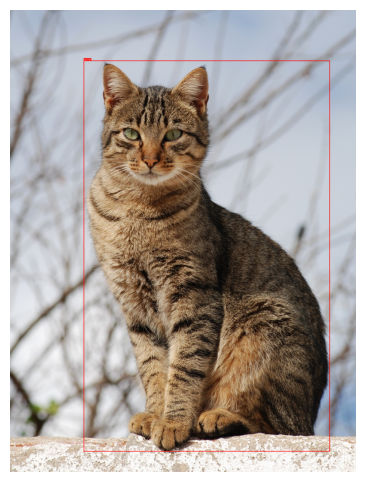

In [22]:
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# 원본 이미지 로드
img_path = "../../img_samples/cat.png"
img = Image.open(img_path).convert("RGB")
draw = ImageDraw.Draw(img)

# 폰트 (환경에 따라 기본 폰트 사용)
try:
    font = ImageFont.truetype("arial.ttf", 16)
except:
    font = ImageFont.load_default()

# 결과 그리기
for obj in results:
    label = obj["label"]
    score = obj["score"]
    box = obj["box"]  # dict: {xmin, ymin, xmax, ymax}

    xmin, ymin, xmax, ymax = box["xmin"], box["ymin"], box["xmax"], box["ymax"]

    # 박스
    draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)

    # 텍스트
    text = f"{label} {score:.2f}"
    # textbbox로 크기 계산
    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    draw.rectangle([xmin, ymin - text_h - 4, xmin + text_w + 4, ymin], fill="red")
    draw.text((xmin + 2, ymin - text_h - 2), text, fill="white", font=font)
# 출력
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis("off")
plt.show()

상세 사용법

In [23]:
from transformers import AutoImageProcessor, AutoModelForObjectDetection
from PIL import Image, ImageDraw
import requests
import torch
from io import BytesIO

model_name = "facebook/detr-resnet-50"

# 로드
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForObjectDetection.from_pretrained(model_name)

# 이미지 로드
headers = {"User-Agent": "Mozilla/5.0"}
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
resp = requests.get(url, headers=headers, timeout=10)
resp.raise_for_status()
image = Image.open(BytesIO(resp.content)).convert("RGB")

# 전처리
inputs = processor(images=image, return_tensors="pt")

# 추론
with torch.no_grad():
    outputs = model(**inputs)

# 후처리 (threshold 적용)
target_sizes = torch.tensor([image.size[::-1]])  # (height, width)
results = processor.post_process_object_detection(
    outputs,
    target_sizes=target_sizes,
    threshold=0.9
)[0]

# 결과 출력
print("=== Detection Results ===")
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    label_name = model.config.id2label[label.item()]
    print(f"  {label_name:15} | Score: {score.item():.4f} | Box: {box}")

# 시각화
def visualize_detection(image, results, model):
    draw = ImageDraw.Draw(image)
    
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = box.tolist()
        label_name = model.config.id2label[label.item()]
        
        # 박스 그리기
        draw.rectangle(box, outline="red", width=3)
        
        # 라벨 텍스트
        text = f"{label_name}: {score.item():.2f}"
        draw.text((box[0], box[1] - 15), text, fill="red")
    
    return image

# 결과 이미지
result_image = visualize_detection(image.copy(), results, model)
result_image.save("detection_result.jpg")

/Users/kmyu/Desktop/project/cv-study/.venv/lib/python3.12/site-packages/torch/nn/modules/module.py:2446: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/Users/kmyu/Desktop/project/cv-study/.venv/lib/python3.12/site-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/Users/kmyu/Desktop/project/cv-study/.venv/lib/python3.12/site-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.bias: copying from a non-meta parameter in

Loading weights:   0%|          | 0/530 [00:00<?, ?it/s]

DetrForObjectDetection LOAD REPORT from: facebook/detr-resnet-50
Key                                                                         | Status     |  | 
----------------------------------------------------------------------------+------------+--+-
model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


=== Detection Results ===
  remote          | Score: 0.9982 | Box: [40.16, 70.82, 175.56, 118.01]
  remote          | Score: 0.9960 | Box: [333.17, 72.58, 368.26, 187.67]
  couch           | Score: 0.9955 | Box: [-0.02, 1.15, 639.72, 473.77]
  cat             | Score: 0.9988 | Box: [13.3, 52.03, 313.94, 470.97]
  cat             | Score: 0.9987 | Box: [345.39, 23.9, 640.37, 368.81]
